## DATA 422 Group Project - Josie (jst218) - Earthquake data

In [71]:
# Libraries
library(here)
library(tidyverse)
library(sf)
library(glue)
library(geojsonio)
library(dplyr)
library(rgeos)
library(sp)
library(rgdal)


[1] "/Users/josiestockill/Downloads"

## URLs for earthquakes downloads

- https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2017-03-01&enddate=2017-12-31T7:00:00
- https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2016-11-01&enddate=2017-03-01
- https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2015-11-01&enddate=2016-11-01
- https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2014-11-01&enddate=2015-11-01
- https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2014-01-01T7:00:00&enddate=2014-11-01

In [78]:
# Read in each of the csv's (there is a 20,000 row limit on the exports from geonet Quake Search)

earthquake1 <- read.csv("https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2017-03-01&enddate=2017-12-31T7:00:00")
earthquake2 <- read.csv("https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2016-11-01&enddate=2017-03-01")
earthquake3 <- read.csv("https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2015-11-01&enddate=2016-11-01")
earthquake4 <- read.csv("https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2014-11-01&enddate=2015-11-01")
earthquake5 <- read.csv("https://quakesearch.geonet.org.nz/csv?bbox=163.5205,-49.1817,-176.9238,-32.2871&startdate=2014-01-01T7:00:00&enddate=2014-11-01")
  
# Row bind the csv's into one dataframe
quakes <- do.call("rbind", list(earthquake1, earthquake2, earthquake3, earthquake4,earthquake5))


In [79]:
head(quakes)

,publicid,eventtype,origintime,modificationtime,longitude,latitude,magnitude,depth,magnitudetype,depthtype,⋯,evaluationstatus,evaluationmode,earthmodel,usedphasecount,usedstationcount,magnitudestationcount,minimumdistance,azimuthalgap,originerror,magnitudeuncertainty
,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,2017p984556,,2017-12-31T06:51:30.034Z,2017-12-31T06:53:28.344Z,175.0064,-41.39838,1.581007,21.640625,M,,⋯,,automatic,nz3drx,11,11,7,0.10245887,130.07508,0.1787867,0
2,2017p984528,,2017-12-31T06:37:56.519Z,2017-12-31T06:41:02.657Z,175.9204,-38.87388,2.193771,159.687500,M,,⋯,,automatic,nz3drx,37,37,18,0.35726708,189.89333,1.6659082,0
3,2017p984480,,2017-12-31T06:11:04.004Z,2017-12-31T06:12:38.146Z,175.8808,-40.61563,1.588915,25.390625,M,,⋯,,automatic,nz3drx,14,14,8,0.09205309,81.91769,0.2982634,0
4,2017p984181,,2017-12-31T03:31:52.604Z,2017-12-31T03:34:17.625Z,176.0742,-39.27950,2.179969,46.484375,M,,⋯,,automatic,nz3drx,55,55,36,0.21035583,45.83764,0.5727317,0
5,2017p984157,,2017-12-31T03:19:38.237Z,2017-12-31T03:21:40.391Z,177.0645,-39.55705,1.847687,20.468750,M,,⋯,,automatic,nz3drx,12,12,6,0.28505316,195.40885,0.3182329,0
6,2017p984059,,2017-12-31T02:26:53.331Z,2017-12-31T02:28:37.743Z,174.3273,-41.68864,2.106633,9.921875,M,,⋯,,automatic,nz3drx,19,19,8,0.10563158,138.80680,0.4924095,0


## Import shapefile of regional council areas
https://koordinates.com/from/datafinder.stats.govt.nz/layer/106666/download/

Note: Must set the projection to WGS 84

In [76]:
# Important - all other files that come with the .shp file (in the zip download) 
# must be in the same folder as you are calling the .shp file from
# Unzip the download folder and then take all contents to directory you are calling from

regions <- st_read("regional-council-2022-generalised.shp") %>%
           st_transform(crs = 4326)

Reading layer `regional-council-2022-generalised' from data source 
  `/Users/josiestockill/Downloads/regional-council-2022-generalised.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 17 features and 6 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -177.3579 ymin: -47.72405 xmax: 178.8362 ymax: -33.9585
CRS:           4326


In [80]:
# Combine the dataframes 

reg_quakes <- quakes %>%
              st_as_sf(coords= c("longitude", "latitude"), crs=4326) %>%
              st_join(regions)
head(reg_quakes)

publicid    eventtype origintime               modificationtime        
1 2017p984556           2017-12-31T06:51:30.034Z 2017-12-31T06:53:28.344Z
2 2017p984528           2017-12-31T06:37:56.519Z 2017-12-31T06:41:02.657Z
3 2017p984480           2017-12-31T06:11:04.004Z 2017-12-31T06:12:38.146Z
4 2017p984181           2017-12-31T03:31:52.604Z 2017-12-31T03:34:17.625Z
5 2017p984157           2017-12-31T03:19:38.237Z 2017-12-31T03:21:40.391Z
6 2017p984059           2017-12-31T02:26:53.331Z 2017-12-31T02:28:37.743Z
  magnitude depth      magnitudetype depthtype evaluationmethod
1 1.581007   21.640625 M                       NonLinLoc       
2 2.193771  159.687500 M                       NonLinLoc       
3 1.588915   25.390625 M                       NonLinLoc       
4 2.179969   46.484375 M                       NonLinLoc       
5 1.847687   20.468750 M                       NonLinLoc       
6 2.106633    9.921875 M                       NonLinLoc       
  evaluationstatus geometry                   ⋯ azimuthalgap originerror
1                  POINT (175.0064 -41.39838) ⋯ 130.07508    0.1787867  
2                  POINT (175.9204 -38.87388) ⋯ 189.89333    1.6659082  
3                  POINT (175.8808 -40.61563) ⋯  81.91769    0.2982634  
4                  POINT (176.0742 -39.2795)  ⋯  45.83764    0.5727317  
5                  POINT (177.0645 -39.55705) ⋯ 195.40885    0.3182329  
6                  POINT (174.3273 -41.68864) ⋯ 138.80680    0.4924095  
  magnitudeuncertainty REGC2022_V REGC2022_1               
1 0                    09         Wellington Region        
2 0                    03         Waikato Region           
3 0                    08         Manawatū-Whanganui Region
4 0                    08         Manawatū-Whanganui Region
5 0                    06         Hawke's Bay Region       
6 0                    18         Marlborough Region       
  REGC2022_2                LAND_AREA_ AREA_SQ_KM Shape_Leng
1 Wellington Region          8049.438  15945.28    579215.5 
2 Waikato Region            23901.091  34888.83   1268419.8 
3 Manawatu-Whanganui Region 22220.666  25322.21   1176437.1 
4 Manawatu-Whanganui Region 22220.666  25322.21   1176437.1 
5 Hawke's Bay Region        14139.146  21444.17    928781.4 
6 Marlborough Region        10457.792  17688.80    766974.0 
  geometry                  
1 POINT (175.0064 -41.39838)
2 POINT (175.9204 -38.87388)
3 POINT (175.8808 -40.61563)
4 POINT (176.0742 -39.2795) 
5 POINT (177.0645 -39.55705)
6 POINT (174.3273 -41.68864)

In [75]:
# View regions
unique(reg_quakes$REGC2022_1)

[1] Manawatū-Whanganui Region Hawke's Bay Region       
 [3] Marlborough Region        West Coast Region        
 [5] Canterbury Region         Bay of Plenty Region     
 [7] <NA>                      Gisborne Region          
 [9] Waikato Region            Otago Region             
[11] Wellington Region         Southland Region         
[13] Taranaki Region           Tasman Region            
[15] Nelson Region             Auckland Region          
[17] Northland Region         
17 Levels: Area Outside Region Auckland Region ... West Coast Region

In [81]:
# Convert sf.dataframe to dataframe and select columns

reg_quakes <- as.data.frame(reg_quakes)

reg_quakes <- reg_quakes %>%
              select(publicid, origintime, magnitude, depth,REGC2022_2, REGC2022_V)

head(reg_quakes)

,publicid,origintime,magnitude,depth,REGC2022_2,REGC2022_V
,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>
1,2017p984556,2017-12-31T06:51:30.034Z,1.581007,21.640625,Wellington Region,09
2,2017p984528,2017-12-31T06:37:56.519Z,2.193771,159.687500,Waikato Region,03
3,2017p984480,2017-12-31T06:11:04.004Z,1.588915,25.390625,Manawatu-Whanganui Region,08
4,2017p984181,2017-12-31T03:31:52.604Z,2.179969,46.484375,Manawatu-Whanganui Region,08
5,2017p984157,2017-12-31T03:19:38.237Z,1.847687,20.468750,Hawke's Bay Region,06
6,2017p984059,2017-12-31T02:26:53.331Z,2.106633,9.921875,Marlborough Region,18


In [82]:
# Edit date column to be year only

reg_quakes$year = as.numeric(substr(reg_quakes$origintime, 1, 4))

head(reg_quakes)


,publicid,origintime,magnitude,depth,REGC2022_2,REGC2022_V,year
,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>,<dbl>
1,2017p984556,2017-12-31T06:51:30.034Z,1.581007,21.640625,Wellington Region,09,2017
2,2017p984528,2017-12-31T06:37:56.519Z,2.193771,159.687500,Waikato Region,03,2017
3,2017p984480,2017-12-31T06:11:04.004Z,1.588915,25.390625,Manawatu-Whanganui Region,08,2017
4,2017p984181,2017-12-31T03:31:52.604Z,2.179969,46.484375,Manawatu-Whanganui Region,08,2017
5,2017p984157,2017-12-31T03:19:38.237Z,1.847687,20.468750,Hawke's Bay Region,06,2017
6,2017p984059,2017-12-31T02:26:53.331Z,2.106633,9.921875,Marlborough Region,18,2017


In [88]:
# This step is where we can filter by magnitude - I've picked mag < 4

nrow(reg_quakes)

reg_quakes_over4 <- reg_quakes %>%
              filter(magnitude > 4.0)

nrow(reg_quakes_over4)

[1] 102187

[1] 2265

In [89]:
# Aggregate to a regional level and calculate average magnitude for the year (of quakes over 4)

reg_quakes_over4$rownum <- 1

reg_quakes_over4 <- reg_quakes_over4 %>%
                    group_by(year, REGC2022_2, REGC2022_V) %>%
                    summarise(count_quakes = sum(rownum),
                              ave_mag      = mean(magnitude))

reg_quakes_over4

`summarise()` has grouped output by 'year', 'REGC2022_2'. You can override
using the `.groups` argument.


year,REGC2022_2,REGC2022_V,count_quakes,ave_mag
<dbl>,<fct>,<fct>,<dbl>,<dbl>
2014,Bay of Plenty Region,04,7,4.349858
2014,Canterbury Region,13,6,4.275236
2014,Gisborne Region,05,4,4.422094
2014,Hawke's Bay Region,06,8,4.471996
2014,Manawatu-Whanganui Region,08,25,4.471525
2014,Marlborough Region,18,7,4.136728
2014,Otago Region,14,1,4.044708
2014,Southland Region,15,14,4.510727
2014,Tasman Region,16,1,4.196938


In [100]:
# Transform regions to characters

reg_quakes_over4$REGC2022_2 <- as.character(reg_quakes_over4$REGC2022_2)

head(reg_quakes_over4)

year,REGC2022_2,REGC2022_V,count_quakes,ave_mag
<dbl>,<chr>,<fct>,<dbl>,<dbl>
2014,Bay of Plenty Region,04,7,4.349858
2014,Canterbury Region,13,6,4.275236
2014,Gisborne Region,05,4,4.422094
2014,Hawke's Bay Region,06,8,4.471996
2014,Manawatu-Whanganui Region,08,25,4.471525
2014,Marlborough Region,18,7,4.136728


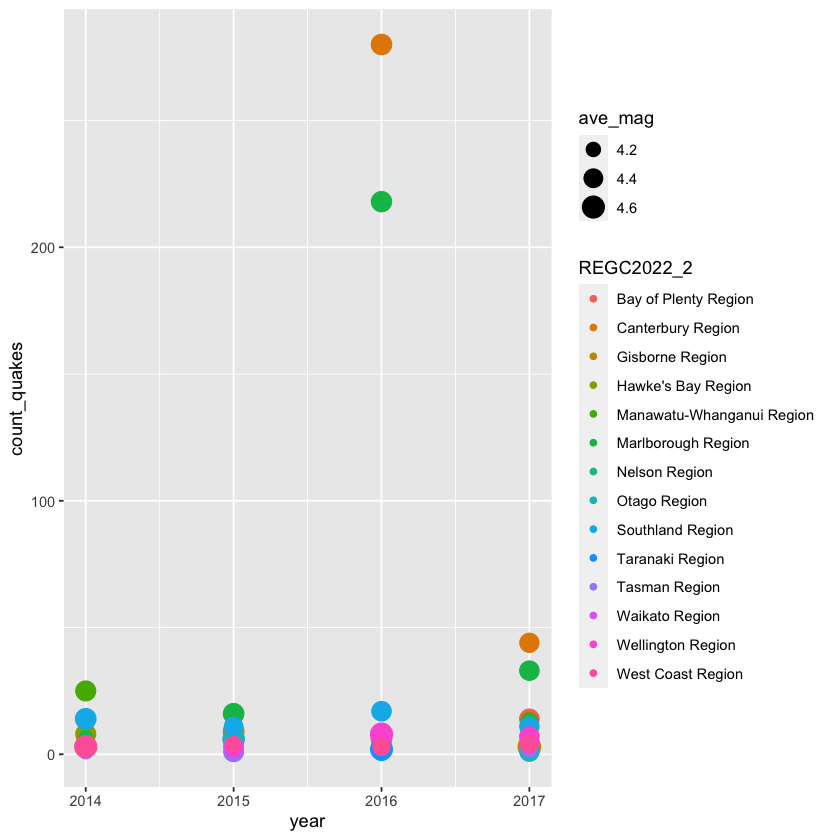

In [102]:
# Quick plot
reg_quakes_over4v2 <- reg_quakes_over4 %>% filter(REGC2022_2 != 'NA')

plot <- ggplot(reg_quakes_over4v2,
               aes(x=year, y=count_quakes, colour=REGC2022_2,
                  size=ave_mag)) + geom_point()
plot

There are two big outliers, lets exclude them to see the other points in detail

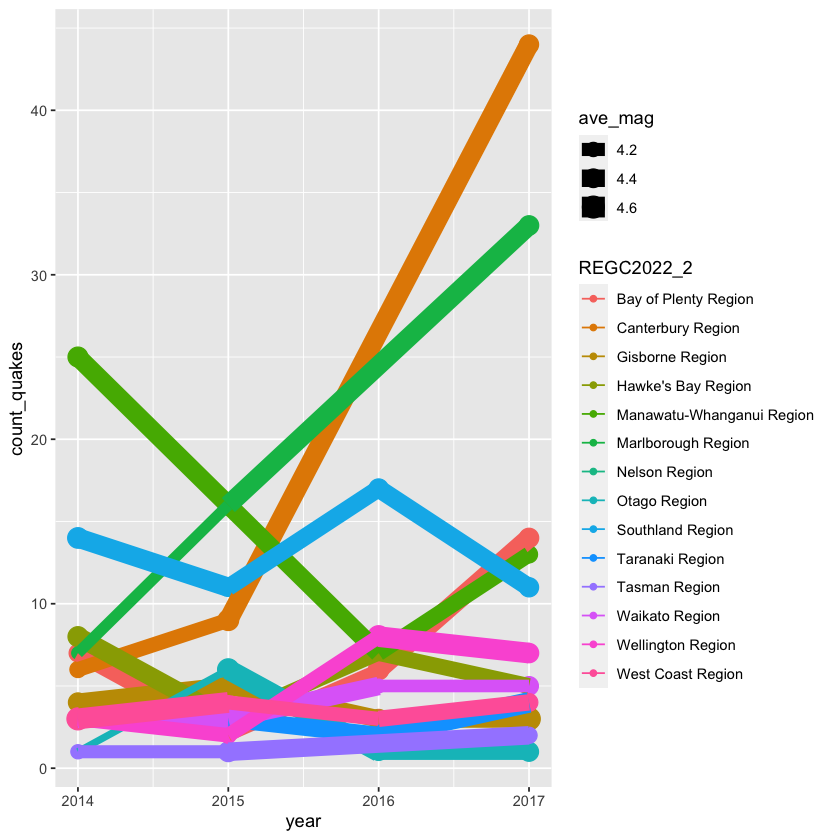

In [104]:
# Quick plot #2
reg_quakes_over4v3 <- reg_quakes_over4v2 %>% filter(count_quakes < 100)

plot2 <- ggplot(reg_quakes_over4v3,
               aes(x=year, y=count_quakes, colour=REGC2022_2,
                  size=ave_mag)) + geom_point() + geom_line()
plot2

### Attempt to plot an animated map

In [105]:
library(ggmap)

ERROR: Error: package or namespace load failed for ‘ggmap’ in loadNamespace(j <- i[[1L]], c(lib.loc, .libPaths()), versionCheck = vI[[j]]):
 there is no package called ‘rjson’


In [106]:
# Define my location
myLocation <- c(lat=41.2924, long=174.7787)

In [107]:
myMap <- get_map(location=myLocation,
source="stamen", maptype="terrain", crop=FALSE)
ggmap(myMap)

ERROR: Error in get_map(location = myLocation, source = "stamen", maptype = "terrain", : could not find function "get_map"


In [154]:
head(reg_quakes)

,publicid,origintime,magnitude,depth,REGC2022_2,REGC2022_V,year
,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>,<dbl>
1,2017p984556,2017-12-31T06:51:30.034Z,1.581007,21.640625,Wellington Region,09,2017
2,2017p984528,2017-12-31T06:37:56.519Z,2.193771,159.687500,Waikato Region,03,2017
3,2017p984480,2017-12-31T06:11:04.004Z,1.588915,25.390625,Manawatu-Whanganui Region,08,2017
4,2017p984181,2017-12-31T03:31:52.604Z,2.179969,46.484375,Manawatu-Whanganui Region,08,2017
5,2017p984157,2017-12-31T03:19:38.237Z,1.847687,20.468750,Hawke's Bay Region,06,2017
6,2017p984059,2017-12-31T02:26:53.331Z,2.106633,9.921875,Marlborough Region,18,2017


In [ ]:
# New attempt


quakes_plot <- reg_quakesplt %>% 
  select(lon = long, lat, group, id = subregion)

ggplot(quakes_plot, aes(lon, lat, group = group)) +
  geom_polygon(fill = "white", colour = "grey50") + 
  coord_quickmap()

In [109]:
reg_quakesplt <- quakes %>%
              st_as_sf(coords= c("longitude", "latitude"), crs=4326) %>%
              st_join(regions)

In [112]:
#head(reg_quakesplt)
class(reg_quakesplt$geometry)

[1] "sfc_POINT" "sfc"

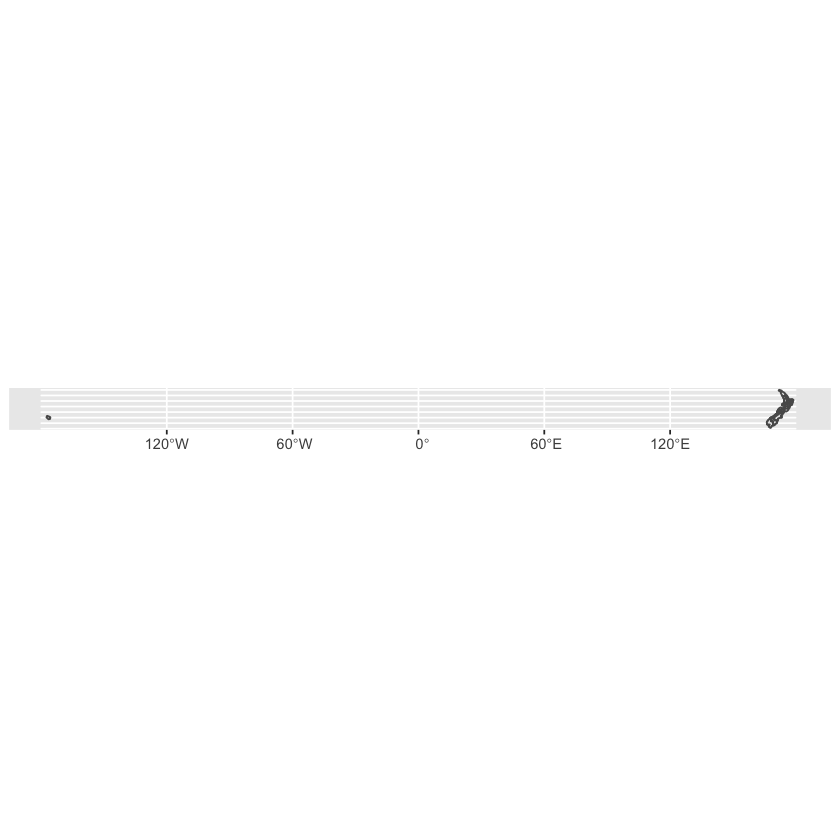

In [115]:
# I don't need a joined dataframe for the plot...

regions2 <- regions %>% filter(REGC2022_2!="NA")
ggplot(regions2) + 
  geom_sf() + 
  coord_sf()

[1] Northland Region          Auckland Region          
 [3] Waikato Region            Bay of Plenty Region     
 [5] Gisborne Region           Hawke's Bay Region       
 [7] Taranaki Region           Manawatu-Whanganui Region
 [9] Wellington Region         West Coast Region        
[11] Canterbury Region         Otago Region             
[13] Southland Region          Tasman Region            
[15] Nelson Region             Marlborough Region       
[17] Area Outside Region      
17 Levels: Area Outside Region Auckland Region ... West Coast Region

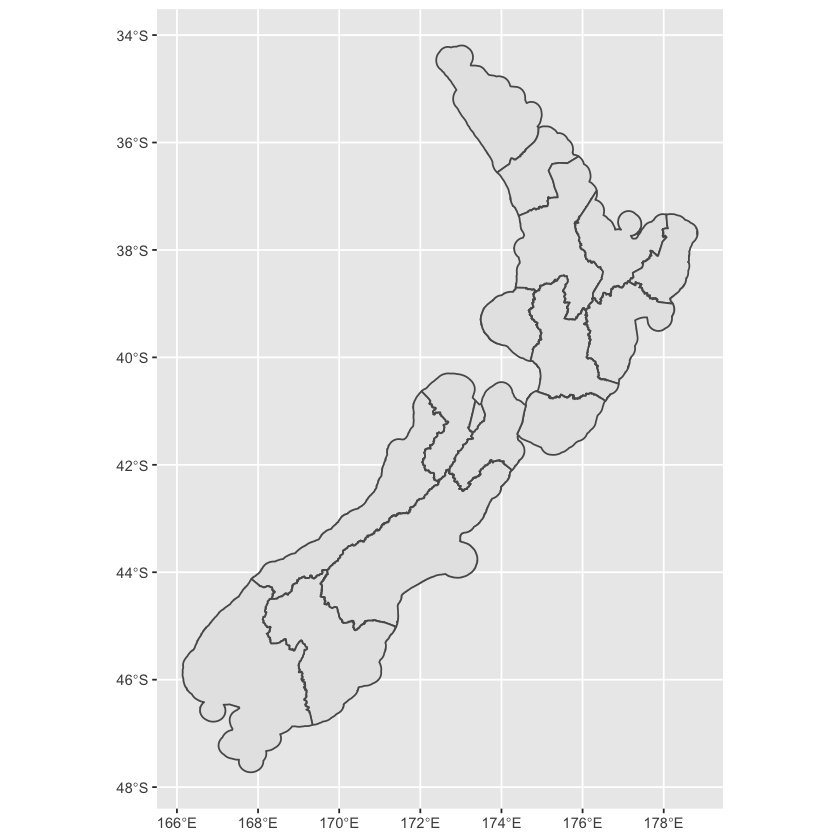

In [117]:
# Need to remove chathams (?)
#unique(regions2$REGC2022_2)

regions3 <- regions %>% filter(REGC2022_2!="Area Outside Region")
ggplot(regions3) + 
  geom_sf() + 
  coord_sf()


In [119]:
# Add year column to quakes
quakes_mappoints <- quakes 
quakes_mappoints$year = as.numeric(substr(quakes_mappoints$origintime, 1, 4))
#head(quakes_mappoints)
unique(quakes_mappoints$year)


[1] 2017 2016 2015 2014

In [121]:
head(reg_quakes)

,publicid,origintime,magnitude,depth,REGC2022_2,REGC2022_V,year
,<fct>,<fct>,<dbl>,<dbl>,<fct>,<fct>,<dbl>
1,2017p984556,2017-12-31T06:51:30.034Z,1.581007,21.640625,Wellington Region,09,2017
2,2017p984528,2017-12-31T06:37:56.519Z,2.193771,159.687500,Waikato Region,03,2017
3,2017p984480,2017-12-31T06:11:04.004Z,1.588915,25.390625,Manawatu-Whanganui Region,08,2017
4,2017p984181,2017-12-31T03:31:52.604Z,2.179969,46.484375,Manawatu-Whanganui Region,08,2017
5,2017p984157,2017-12-31T03:19:38.237Z,1.847687,20.468750,Hawke's Bay Region,06,2017
6,2017p984059,2017-12-31T02:26:53.331Z,2.106633,9.921875,Marlborough Region,18,2017


In [126]:
unique(reg_quakes$REGC2022_2)

[1] Wellington Region         Waikato Region           
 [3] Manawatu-Whanganui Region Hawke's Bay Region       
 [5] Marlborough Region        West Coast Region        
 [7] Canterbury Region         Bay of Plenty Region     
 [9] <NA>                      Gisborne Region          
[11] Otago Region              Southland Region         
[13] Taranaki Region           Tasman Region            
[15] Nelson Region             Auckland Region          
[17] Northland Region         
17 Levels: Area Outside Region Auckland Region ... West Coast Region

In [131]:
# Remove quakes outside region

# get list of IDs of quakes outside region
list_df <- reg_quakes %>% select(publicid, REGC2022_2) %>%
          filter(is.na(REGC2022_2))
#head(list_df)

quakes_mappoints2 <- anti_join(quakes_mappoints, list_df, by="publicid")
head(quakes_mappoints2)

,publicid,eventtype,origintime,modificationtime,longitude,latitude,magnitude,depth,magnitudetype,depthtype,⋯,evaluationmode,earthmodel,usedphasecount,usedstationcount,magnitudestationcount,minimumdistance,azimuthalgap,originerror,magnitudeuncertainty,year
,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,⋯,<fct>,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2017p984556,,2017-12-31T06:51:30.034Z,2017-12-31T06:53:28.344Z,175.0064,-41.39838,1.581007,21.640625,M,,⋯,automatic,nz3drx,11,11,7,0.10245887,130.07508,0.1787867,0,2017
2,2017p984528,,2017-12-31T06:37:56.519Z,2017-12-31T06:41:02.657Z,175.9204,-38.87388,2.193771,159.687500,M,,⋯,automatic,nz3drx,37,37,18,0.35726708,189.89333,1.6659082,0,2017
3,2017p984480,,2017-12-31T06:11:04.004Z,2017-12-31T06:12:38.146Z,175.8808,-40.61563,1.588915,25.390625,M,,⋯,automatic,nz3drx,14,14,8,0.09205309,81.91769,0.2982634,0,2017
4,2017p984181,,2017-12-31T03:31:52.604Z,2017-12-31T03:34:17.625Z,176.0742,-39.27950,2.179969,46.484375,M,,⋯,automatic,nz3drx,55,55,36,0.21035583,45.83764,0.5727317,0,2017
5,2017p984157,,2017-12-31T03:19:38.237Z,2017-12-31T03:21:40.391Z,177.0645,-39.55705,1.847687,20.468750,M,,⋯,automatic,nz3drx,12,12,6,0.28505316,195.40885,0.3182329,0,2017
6,2017p984059,,2017-12-31T02:26:53.331Z,2017-12-31T02:28:37.743Z,174.3273,-41.68864,2.106633,9.921875,M,,⋯,automatic,nz3drx,19,19,8,0.10563158,138.80680,0.4924095,0,2017


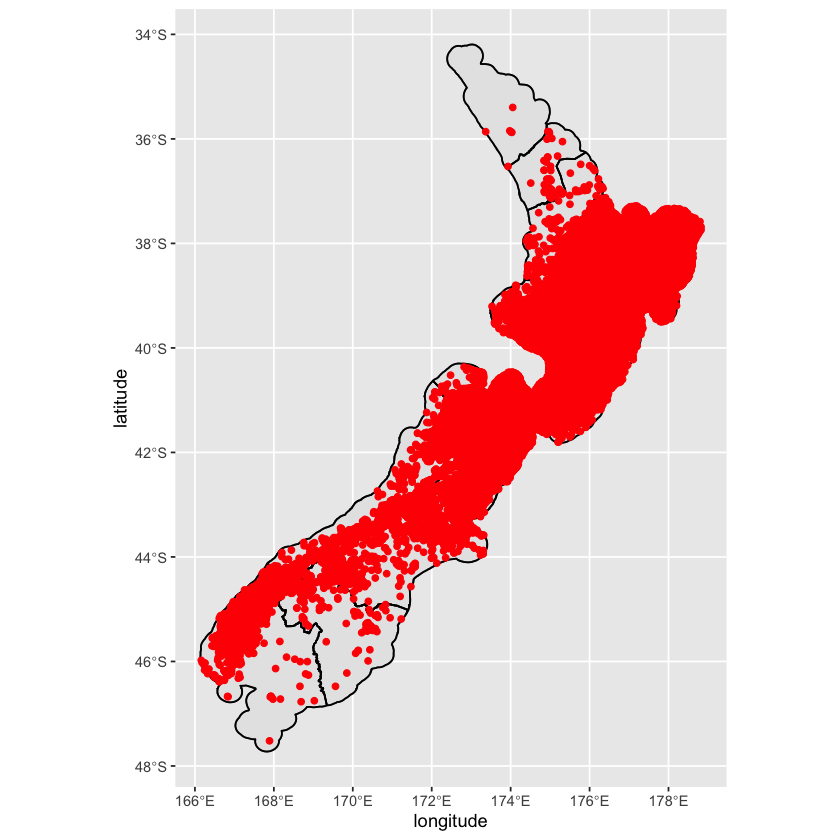

In [170]:
# Plot quakes

allquakes <- ggplot() + 
  geom_sf(data = regions3) + 
  geom_sf(data = regions3, colour = "black", fill = NA) + 
  geom_point(data = quakes_mappoints2, mapping = aes(x = longitude, y = latitude), colour = "red") + 
  coord_sf()
allquakes

In [174]:
# Save as png

ggsave(plot=allquakes, filename="allquakesNZ2014-2017.png", width=7, height=9)

In [133]:

library(gganimate)

In [134]:
# Animate the plot from above
ggplot() + 
  geom_sf(data = regions3) + 
  geom_sf(data = regions3, colour = "black", fill = NA) + 
  geom_point(data = quakes_mappoints2, mapping = aes(x = longitude, y = latitude), colour = "red", size=magnitude) + 
  coord_sf() +
  transition_reveal(as.Date(origintime))


Rendering [-------------------------------------------] at 0.17 fps ~ eta: 10m

Rendering [>------------------------------------------] at 0.17 fps ~ eta: 10m

Rendering [=>-----------------------------------------] at 0.17 fps ~ eta: 10m

Rendering [=>-----------------------------------------] at 0.16 fps ~ eta: 10m

Rendering [==>----------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [===>---------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [====>--------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [=====>-------------------------------------] at 0.17 fps ~ eta:  8m

Rendering [======>------------------------------------] at 0.17 fps ~ eta:  8m

Rendering [=======>-----------------------------------] at 0.17 fps ~ eta:  8m

Rendering [========>----------------------------------] at 0.17 fps ~ eta:  8m

Rendering [=========>---------------------------------] at 0.17 fps ~ eta:  7m

Rendering [==========>-----------------

<img src="data:image/gif;base64,R0lGODlh4AHgAfUAAAICAgsLCxMTExsbGyQkJCwsLDMzMzs7O0c0NUNDQ0xMTFNTU1xcXGRk
ZGtra3Nzc3t7e/oAB/kDCvgJD/cME/gOFPcSGPYcIvUmK+9aXuxtcet2eoSEhIyMjJSUlJyc
nKSkpKurq7S0tLy8vOebneWmp+K+v+K/wMTExMzMzNTU1N/f3+HMzeDU1Obm5urq6vPz8///
/wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8L
TkVUU0NBUEUyLjADAQAAACH/C0lDQ1JHQkcxMDEy/wAAB9hhcHBsAiAAAG1udHJSR0IgWFla
IAfZAAIAGQALABoAC2Fjc3BBUFBMAAAAAGFwcGwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAA
ANMtYXBwbAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
C2Rlc2MAAAEIAAAAb2RzY20AAAF4AAAFnGNwcnQAAAcUAAAAOHd0cHQAAAdMAAAAFHJYWVoA
AAdgAAAAFGdYWVoAAAd0AAAAFGJYWVoAAAeIAAAAFHJUUkMAAAecAAAADmNoYWQAAAesAAAA
LGJUUkMAAAecAAAADmdUUv9DAAAHnAAAAA5kZXNjAAAAAAAAABRHZW5lcmljIFJHQiBQcm9m
aWxlAAAAAAAAAAAAAAAUR2VuZXJpYyBSR0IgUHJvZmlsZQAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAbWx1YwAAAAAAAAAfAAAADHNrU0sAAAAo
AAABhGRhREsAAAAuAAABrGNhRVMAAAAkAAAB2nZpVk4AAAAkAAAB/nB0QlIAAAAmAAACInVr
VUEAAAAqAAACSGZyRlUAAAAoAAACcmh1SFUAAAAoAAACmnpoVFcAAAAWAAACwm5iTk8AAAAm
AAD/Athjc0NaAAAAIgAAAv5oZUlMAAAAHgAAAyBpdElUAAAAKAAAAz5yb1JPAAAAJAAAA2Zk
ZURFAAAALAAAA4prb0tSAAAAFgAAA7ZzdlNFAAAAJgAAAth6aENOAAAAFgAAA8xqYUpQAAAA
GgAAA+JlbEdSAAAAIgAAA/xwdFBPAAAAJgAABB5ubE5MAAAAKAAABERlc0VTAAAAJgAABB50
aFRIAAAAJAAABGx0clRSAAAAIgAABJBmaUZJAAAAKAAABLJockhSAAAAKAAABNpwbFBMAAAA
LAAABQJydVJVAAAAIgAABS5hckVHAAAAJgAABVBlblVTAAAAJgAABXYA/1YBYQBlAG8AYgBl
AGMAbgD9ACAAUgBHAEIAIABwAHIAbwBmAGkAbABHAGUAbgBlAHIAZQBsACAAUgBHAEIALQBi
AGUAcwBrAHIAaQB2AGUAbABzAGUAUABlAHIAZgBpAGwAIABSAEcAQgAgAGcAZQBuAOgAcgBp
AGMAQx6lAHUAIABoAOwAbgBoACAAUgBHAEIAIABDAGgAdQBuAGcAUABlAHIAZgBpAGwAIABS
AEcAQgAgAEcAZQBuAOkAcgBpAGMAbwQXBDAEMwQwBDsETAQ9BDgEOQAgBD8EQAQ+BEQEMAQ5
BDsAIABSAEcAQgBQAHIAbwBmAGkAbAAgAGcA6f8AbgDpAHIAaQBxAHUAZQAgAFIAVgBCAMEA
bAB0AGEAbADhAG4AbwBzACAAUgBHAEIAIABwAHIAbwBmAGkAbJAadSgAIABSAEcAQgAggnJf
aWPPj/AARwBlAG4AZQByAGkAcwBrACAAUgBHAEIALQBwAHIAbwBmAGkAbABPAGIAZQBjAG4A
/QAgAFIARwBCACAAcAByAG8AZgBpAGwF5AXoBdUF5AXZBdwAIABSAEcAQgAgBdsF3AXcBdkA
UAByAG8AZgBpAGwAbwAgAFIARwBCACAAZwBlAG4AZQByAGkAYwBvAFAAcgBvAGYAaQBsACAA
UgBHAEIAIABnAGUAbgD/ZQByAGkAYwBBAGwAbABnAGUAbQBlAGkAbgBlAHMAIABSAEcAQgAt
AFAAcgBvAGYAaQBsx3y8GAAgAFIARwBCACDVBLhc0wzHfGZukBoAIABSAEcAQgAgY8+P8GWH
TvZOAIIsACAAUgBHAEIAIDDXMO0w1TChMKQw6wOTA7UDvQO5A7oDzAAgA8ADwQO/A8YDrwO7
ACAAUgBHAEIAUABlAHIAZgBpAGwAIABSAEcAQgAgAGcAZQBuAOkAcgBpAGMAbwBBAGwAZwBl
AG0AZQBlAG4AIABSAEcAQgAtAHAAcgBvAGYAaQBlAGwOQg4bDiMORA4fDiUOTAAgAFIARwBC
/wAgDhcOMQ5IDicORA4bAEcAZQBuAGUAbAAgAFIARwBCACAAUAByAG8AZgBpAGwAaQBZAGwA
ZQBpAG4AZQBuACAAUgBHAEIALQBwAHIAbwBmAGkAaQBsAGkARwBlAG4AZQByAGkBDQBrAGkA
IABSAEcAQgAgAHAAcgBvAGYAaQBsAFUAbgBpAHcAZQByAHMAYQBsAG4AeQAgAHAAcgBvAGYA
aQBsACAAUgBHAEIEHgQxBEkEOAQ5ACAEPwRABD4ERAQ4BDsETAAgAFIARwBCBkUGRAZBACAG
KgY5BjEGSgZBACAAUgBHAEIAIAYnBkQGOQYnBkUARwBlAG4AZQByAN9pAGMAIABSAEcAQgAg
AFAAcgBvAGYAaQBsAGV0ZXh0AAAAAENvcHlyaWdodCAyMDA3IEFwcGxlIEluYy4sIGFsbCBy
aWdodHMgcmVzZXJ2ZWQuAFhZWiAAAAAAAADzUgABAAAAARbPWFlaIAAAAAAAAHRNAAA97gAA
A9BYWVogAAAAAAAAWnUAAKxzAAAXNFhZWiAAAAAAAAAoGgAAFZ8AALg2Y3VydgAAAAAAAAAB
Ac0AAHNmMzIAAAAAAAEMQgAABd7///MmAAAHkgAA/ZH///ui///9owAAA9wAAMBsACwAAAAA
4AHgAQAG/8CYcEgsGo/IpHLJbDqf0Kh0Sq1ar9isdsvter/gsHhMLpvP6LR6zW673/C4fE6v
2+/4vH7P7/v/gIGCg4SFhlEwiYkvio2NjI+OkJKLjjCTlYqYlpmanJCbl5Seo6SmkaKlnamc
p6yomzGboauorpmMLzGumLSqr6azv76eh8ZYLsnKy5fLzs/Q0dLLstPW19Mx2Nvcydrd4Nnh
49Df5Ocu5ujlx+1T2S/r5NXy4er13Pf42Pr707r+uAEM6M2dwSfwCGJrptBav4bO6EGMJnHi
s4cWBxI8yJFJQovl4oG8KHIkNZMXUUZUeVJhx5dIpjFkWRElRos1Td6cuBNiz/95MIMO+Uiz
pMqfLlkqQ7pRqbeGQqMSVTnzqFGbV3U6TbeVKbioQqdiderVX9l9Z/GllacxINigMrOOzDm3
q1yQa+XlXbc329uXYnXexdm1MFmnbc3+xaNC1xAVQi4JWTEixZHAdckO5mlYad9znykutuMg
hIMVQlAskBUCBAwUDkRw8GAEM97NPjvT1H0U6mg6LyB/GCGLQ4NdIFx7IB4jRG1pdLGVzHr1
ak7c9R4ONioXe/Rnm7EvS6xM/Phk3Z2RLy/NvDgX7qFl/W2nAwMYMTi8cBAZ//4GIDi2nwMg
7IKfIgYaeCB+CSbS4IIQHqiggwgiuMuDEjai4IYQYnj/oYYfRphhhxwyWKGJFYZ4IoYdtrhg
iQ/2B+OJL1JoY381TqgihR5GWOKIEnIY442OCMkgfXSE4EEIH6jAQDpD+CcCA5GFEEIKuaSS
i4EvdHlJLll2CaYoXpY5ZpZfdimLmWSGqeWXZLYZZ5lfyjLnnGemCaeYYPJJpy530hnonmeG
ieaWeAbqZZxtFsqml3Yemuifbo

In [152]:
# Animate a new plot
# - Points coded with size and colour representing magntiude
# - Save to a gif
animateplot2 <- ggplot() + 
  geom_sf(data = regions3) + 
  geom_sf(data = regions3, colour = "black", fill = NA) + 
  geom_point(data = quakes_mappoints2, 
             mapping = aes(name="Magnitude", 
                           x = longitude, y = latitude, 
                           colour = abs(quakes_mappoints2$magnitude)), 
             size=(quakes_mappoints2$magnitude*10)) + 
  labs(colour = "Magnitude") +
  scale_fill_viridis_c(name="Magnitude", option = "magma") +
  coord_sf() +
  transition_reveal(as.Date(origintime))

# Save to gif
animate(animateplot2, renderer = gifski_renderer())
anim_save("earthquakes2014to2016.gif")

Warning message:
“Ignoring unknown aesthetics: name”
Warning message:
“Use of `quakes_mappoints2$magnitude` is discouraged. Use `magnitude` instead.”

Rendering [-------------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [>------------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [=>-----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [==>----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [===>---------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [====>--------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=====>-------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [======>------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=======>-----------------------------------] at 0.18 fps ~ eta:  8m

Rendering [========>----------------------------------] at 0.18 fps ~ eta:  7m

Rendering [=========>----------------------------

Warning message:
“Ignoring unknown aesthetics: name”
Warning message:
“Use of `quakes_mappoints2$magnitude` is discouraged. Use `magnitude` instead.”


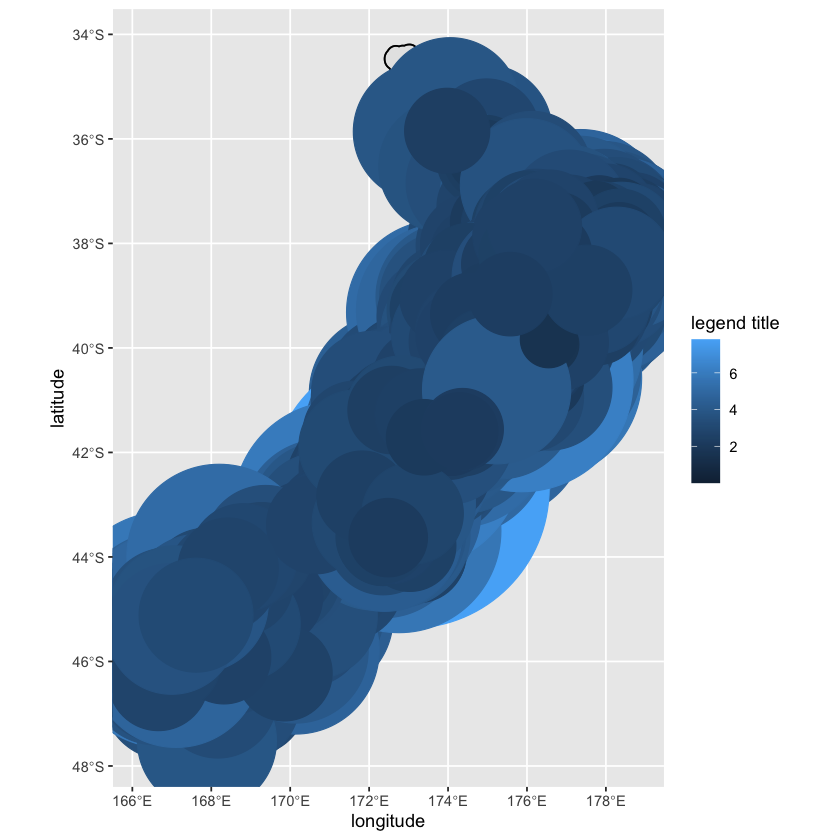

In [151]:
# Stagnant graph of the animated graph above
animateplot2 <- ggplot() + 
  geom_sf(data = regions3) + 
  geom_sf(data = regions3, colour = "black", fill = NA) + 
  geom_point(data = quakes_mappoints2, mapping = aes(name="Magnitude", x = longitude, y = latitude, colour = abs(quakes_mappoints2$magnitude)), 
             size=(quakes_mappoints2$magnitude*10)) + 
  labs(colour = "Magnitude") +
  scale_fill_viridis_c(name="Magnitude", option = "magma") +
  coord_sf() +
  transition_reveal(as.Date(origintime))
animateplot2

In [155]:
head(quakes_mappoints2)

,publicid,eventtype,origintime,modificationtime,longitude,latitude,magnitude,depth,magnitudetype,depthtype,⋯,evaluationmode,earthmodel,usedphasecount,usedstationcount,magnitudestationcount,minimumdistance,azimuthalgap,originerror,magnitudeuncertainty,year
,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,⋯,<fct>,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2017p984556,,2017-12-31T06:51:30.034Z,2017-12-31T06:53:28.344Z,175.0064,-41.39838,1.581007,21.640625,M,,⋯,automatic,nz3drx,11,11,7,0.10245887,130.07508,0.1787867,0,2017
2,2017p984528,,2017-12-31T06:37:56.519Z,2017-12-31T06:41:02.657Z,175.9204,-38.87388,2.193771,159.687500,M,,⋯,automatic,nz3drx,37,37,18,0.35726708,189.89333,1.6659082,0,2017
3,2017p984480,,2017-12-31T06:11:04.004Z,2017-12-31T06:12:38.146Z,175.8808,-40.61563,1.588915,25.390625,M,,⋯,automatic,nz3drx,14,14,8,0.09205309,81.91769,0.2982634,0,2017
4,2017p984181,,2017-12-31T03:31:52.604Z,2017-12-31T03:34:17.625Z,176.0742,-39.27950,2.179969,46.484375,M,,⋯,automatic,nz3drx,55,55,36,0.21035583,45.83764,0.5727317,0,2017
5,2017p984157,,2017-12-31T03:19:38.237Z,2017-12-31T03:21:40.391Z,177.0645,-39.55705,1.847687,20.468750,M,,⋯,automatic,nz3drx,12,12,6,0.28505316,195.40885,0.3182329,0,2017
6,2017p984059,,2017-12-31T02:26:53.331Z,2017-12-31T02:28:37.743Z,174.3273,-41.68864,2.106633,9.921875,M,,⋯,automatic,nz3drx,19,19,8,0.10563158,138.80680,0.4924095,0,2017


In [179]:
# Reduce number of quakes - only over 4.0 magnitude

quakes_over4 <- quakes_mappoints2 %>%
      filter(magnitude > 4.0)

# Add info column
quakes_over4$tooltip <- c(paste0("Year = ", quakes_over4$year, 
                                 "\n Magnitude = ", quakes_over4$magnitude))


In [159]:
library(ggrepel)

In [180]:
quakes_over4$magnitude <- round(quakes_over4$magnitude, 2)
head(quakes_over4)

,publicid,eventtype,origintime,modificationtime,longitude,latitude,magnitude,depth,magnitudetype,depthtype,⋯,earthmodel,usedphasecount,usedstationcount,magnitudestationcount,minimumdistance,azimuthalgap,originerror,magnitudeuncertainty,year,tooltip
,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,⋯,<fct>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,2017p968142,earthquake,2017-12-25T05:06:06.108Z,2017-12-25T05:58:51.069Z,175.0181,-39.24918,4.05,15.671032,M,,⋯,iasp91,54,39,31,0.23721096,71.62614,0.3010330,0,2017,Year = 2017 Magnitude = 4.052774427
2,2017p952681,earthquake,2017-12-19T11:48:31.028Z,2017-12-19T20:58:23.762Z,173.6452,-42.46690,4.55,2.596870,M,,⋯,iasp91,16,11,6,0.04932068,184.49604,0.6675463,0,2017,Year = 2017 Magnitude = 4.549449677
3,2017p932667,earthquake,2017-12-12T02:05:17.976Z,2017-12-13T22:24:49.892Z,166.6546,-45.12274,4.54,5.000000,M,operator assigned,⋯,iasp91,20,15,42,0.80711061,237.16251,1.0121247,0,2017,Year = 2017 Magnitude = 4.538894527
4,2017p932437,earthquake,2017-12-12T00:02:50.663Z,2017-12-13T22:08:56.048Z,173.2365,-43.21674,4.18,21.975813,M,,⋯,iasp91,37,30,101,0.28979206,171.54482,0.5707126,0,2017,Year = 2017 Magnitude = 4.181553909
5,2017p925082,earthquake,2017-12-09T06:44:11.358Z,2017-12-11T03:31:59.431Z,173.5194,-42.21878,4.12,9.787092,M,,⋯,iasp91,38,25,14,0.19760755,85.82767,0.6037388,0,2017,Year = 2017 Magnitude = 4.118115364
6,2017p919876,earthquake,2017-12-07T08:30:16.026Z,2017-12-07T08:46:37.089Z,173.4068,-41.41808,5.00,74.478035,M,,⋯,iasp91,74,44,127,0.16399014,33.72620,0.5902709,0,2017,Year = 2017 Magnitude = 4.99812928


In [181]:
# Test adding labels
animateplot3 <- ggplot() + 
  geom_sf(data = regions3) + 
  geom_sf(data = regions3, colour = "black", fill = NA) + 
  geom_point(data = quakes_over4, 
             mapping = aes(x = longitude, y = latitude, 
                           colour = abs(quakes_over4$magnitude)), 
             size=(quakes_over4$magnitude*10)) + 
  labs(colour = "Magnitude") +
  scale_fill_viridis_c(name="Magnitude", option = "magma") +
  coord_sf() +
  transition_reveal(as.Date(origintime)) +
  geom_label_repel(data = quakes_over4,
      aes(x = longitude, y = latitude, label = quakes_over4$tooltip),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                  segment.color = 'grey50')
animateplot3

Warning message:
“Use of `quakes_over4$magnitude` is discouraged. Use `magnitude` instead.”
Warning message:
“Use of `quakes_over4$tooltip` is discouraged. Use `tooltip` instead.”

Rendering [-------------------------------------------] at 0.17 fps ~ eta: 10m

Rendering [>------------------------------------------] at 0.17 fps ~ eta: 10m

Rendering [>------------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [=>-----------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [=>-----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [==>----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [===>---------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [===>---------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [====>--------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=====>-------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [======>-

<img src="data:image/gif;base64,R0lGODlh4AHgAfcAAAICAgsLCwUHChMTExwcHBcYFw0SGB8gHw0aKREeLREhNhEjOBkpPBco
PA8gNCMjIycoJysrKzQ0NDc4Nzs7OzM2OiswNT9APxUqQx0tQRYuSRcwTBgyTx8wQxk0Uxw6
WyIyRSY2SSs6TS8+UDA/UR0+YT5DSD1CRjRCVD1MXDhHWB5AZSFEayJKcyVOeSVQfUNDQ0JH
TEtMS0dJSUFOX1NTU1xcXFdYV09QT0RSYk5ba0pXZlVdZ09ecVRgb1JidFllcldneWNkY2do
Z2tsa29wb2dyfnNzc3x8fHd4d2FseX+AfyZSgShWhilZiitdkixgly5kmjBlnTBpojJtqTRw
rjV1tDd5uzh8v1VshVdxjFp4l213gnR9h2l9kl1+oTl+wnaFlXyEjl6BpWGGrGOMtniWtWWR
vTqBxzuEzT6K1UCO2UCQ3WiXxmye0G2j2Xyp1UKU4kOX6EWa7Eae8nGs5nW283Ku6ISEhIuL
i4eIh4KKlYOOmomSnpSUlJubm5eYl5+gn4WTo4eZrJSbo5Sbo4mds4ykvIuht56mr6SkpKeo
p6urq6GmrK+wr6WrsamutK2yt6+zuLS0tLK2uru8u7a5vb/Av46pxJGuzIKt15Oz1JS425Gw
z7u9waO4zZa9473AxJrD65zJ9K/W+6rH5MTExMvLy8THyc/Qz83O0dPU1NfY19/f39bY2c/R
09/g39/f4M3l/ebm5ufo5+vr6+/w7/Pz8/f49////wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACH/
C0lDQ1JHQkcxMDEy/wAAB9hhcHBsAiAAAG1udHJSR0IgWFlaIAfZAAIAGQALABoAC2Fjc3BB
UFBMAAAAAGFwcGwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAAANMtYXBwbAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAC2Rlc2MAAAEIAAAAb2RzY20A
AAF4AAAFnGNwcnQAAAcUAAAAOHd0cHQAAAdMAAAAFHJYWVoAAAdgAAAAFGdYWVoAAAd0AAAA
FGJYWVoAAAeIAAAAFHJUUkMAAAecAAAADmNoYWQAAAesAAAALGJUUkMAAAecAAAADmdUUv9D
AAAHnAAAAA5kZXNjAAAAAAAAABRHZW5lcmljIFJHQiBQcm9maWxlAAAAAAAAAAAAAAAUR2Vu
ZXJpYyBSR0IgUHJvZmlsZQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAbWx1YwAAAAAAAAAfAAAADHNrU0sAAAAoAAABhGRhREsAAAAuAAABrGNh
RVMAAAAkAAAB2nZpVk4AAAAkAAAB/nB0QlIAAAAmAAACInVrVUEAAAAqAAACSGZyRlUAAAAo
AAACcmh1SFUAAAAoAAACmnpoVFcAAAAWAAACwm5iTk8AAAAmAAD/Athjc0NaAAAAIgAAAv5o
ZUlMAAAAHgAAAyBpdElUAAAAKAAAAz5yb1JPAAAAJAAAA2ZkZURFAAAALAAAA4prb0tSAAAA
FgAAA7ZzdlNFAAAAJgAAAth6aENOAAAAFgAAA8xqYUpQAAAAGgAAA+JlbEdSAAAAIgAAA/xw
dFBPAAAAJgAABB5ubE5MAAAAKAAABERlc0VTAAAAJgAABB50aFRIAAAAJAAABGx0clRSAAAA
IgAABJBmaUZJAAAAKAAABLJockhSAAAAKAAABNpwbFBMAAAALAAABQJydVJVAAAAIgAABS5h
ckVHAAAAJgAABVBlblVTAAAAJgAABXYA/1YBYQBlAG8AYgBlAGMAbgD9ACAAUgBHAEIAIABw
AHIAbwBmAGkAbABHAGUAbgBlAHIAZQBsACAAUgBHAEIALQBiAGUAcwBrAHIAaQB2AGUAbABz
AGUAUABlAHIAZgBpAGwAIABSAEcAQgAgAGcAZQBuAOgAcgBpAGMAQx6lAHUAIABoAOwAbgBo
ACAAUgBHAEIAIABDAGgAdQBuAGcAUABlAHIAZgBpAGwAIABSAEcAQgAgAEcAZQBuAOkAcgBp
AGMAbwQXBDAEMwQwBDsETAQ9BDgEOQAgBD8EQAQ+BEQEMAQ5BDsAIABSAEcAQgBQAHIAbwBm
AGkAbAAgAGcA6f8AbgDpAHIAaQBxAHUAZQAgAFIAVgBCAMEAbAB0AGEAbADhAG4AbwBzACAA
UgBHAEIAIABwAHIAbwBmAGkAbJAadSgAIABSAEcAQgAggnJfaWPPj/AARwBlAG4AZQByAGkA
cwBrACAAUgBHAEIALQBwAHIAbwBmAGkAbABPAGIAZQBjAG4A/QAgAFIARwBCACAAcAByAG8A
ZgBpAGwF5AXoBdUF5AXZBdwAIABSAEcAQgAgBdsF3AXcBdkAUAByAG8AZgBpAGwAbwAgAFIA
RwBCACAAZwBlAG4AZQByAGkAYwBvAFAAcgBvAGYAaQBsACAAUgBHAEIAIABnAGUAbgD/ZQBy
AGkAYwBBAGwAbABnAGUAbQBlAGkAbgBlAHMAIABSAEcAQgAtAFAAcgBvAGYAaQBsx3y8GAAg
AFIARwBCACDVBLhc0wzHfGZukBoAIABSAEcAQgAgY8+P8GWHTvZOAIIsACAAUgBHAEIAIDDX
MO0w1TChMKQw6wOTA7UDvQO5A7oDzAAgA8ADwQO/A8YDrwO7ACAAUgBHAEIAUABlAHIAZgBp
AGwAIABSAEcAQgAgAGcAZQBuAOkAcgBpAGMAbwBBAGwAZwBlAG0AZQBlAG4AIABSAEcAQgAt
AHAAcgBvAGYAaQBlAGwOQg4bDiMORA4fDiUOTAAgAFIARwBC/wAgDhcOMQ5IDicORA4bAEcA
ZQBuAGUAbAAgAFIARwBCACAAUAByAG8AZgBpAGwAaQBZAGwAZQBpAG4AZQBuACAAUgBHAEIA
LQBwAHIAbwBmAGkAaQBsAGkARwBlAG4AZQByAGkBDQBrAGkAIABSAEcAQgAgAHAAcgBvAGYA
aQBsAFUAbgBpAHcAZQByAHMAYQBsAG4AeQAgAHAAcgBvAGYAaQBsACAAUgBHAEIEHgQxBEkE
OAQ5ACAEPwRABD4ERAQ4BDsETAAgAFIARwBCBkUGRAZBACAGKgY5BjEGSgZBACAAUgBHAEIA
IAYnBkQGOQYnBkUARwBlAG4AZQByAN9pAGMAIABSAEcAQgAgAFAAcgBvAGYAaQBsAGV0ZXh0
AAAAAENvcHlyaWdodCAyMDA3IEFwcGxlIEluYy4sIGFsbCByaWdodHMgcmVzZXJ2ZWQuAFhZ
WiAAAAAAAADzUgABAAAAARbPWFlaIAAAAAAAAHRNAAA97gAAA9BYWVogAAAAAAAAWnUAAKxz
AAAXNFhZWiAAAAAAAAAoGgAAFZ8AALg2Y3VydgAAAAAAAAABAc0AAHNmMzIAAAAAAAEMQgAA
Bd7///MmAAAHkgAA/ZH///ui///9owAAA9wAAMBsACwAAAAA4AHgAQAI/wBzCRxIsKDBgwgT
KlzIsKHDhxAjSpxIsaLFixgzatzIsaPHjyBDihxJsqTJkyhTqlzJsqXLlzBjypxJs6bNmzhz
6tzJs6fPnxdxvRTqkmhLoyyRrl

In [182]:
# Filter out earthquakes & slow down animation


# Save to gif
animate(animateplot3, renderer = gifski_renderer(), fps=1.5)
anim_save("earthquakes2014to2016_overmag4.gif")

Warning message:
“Use of `quakes_over4$magnitude` is discouraged. Use `magnitude` instead.”
Warning message:
“Use of `quakes_over4$tooltip` is discouraged. Use `tooltip` instead.”

Rendering [-------------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [>------------------------------------------] at 0.17 fps ~ eta: 10m

Rendering [>------------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [=>-----------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [==>----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [==>----------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [==>----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [===>---------------------------------------] at 0.17 fps ~ eta:  9m

Rendering [===>---------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [====>--------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=====>--

In [183]:
# one last attempt - smaller dots and slower speed
animateplot4 <- ggplot() + 
  geom_sf(data = regions3) + 
  geom_sf(data = regions3, colour = "black", fill = NA) + 
  geom_point(data = quakes_over4, 
             mapping = aes(x = longitude, y = latitude, 
                           colour = abs(quakes_over4$magnitude)), 
             size=(quakes_over4$magnitude)) + 
  labs(colour = "Magnitude") +
  scale_fill_viridis_c(name="Magnitude", option = "magma") +
  coord_sf() +
  transition_reveal(as.Date(origintime)) +
  geom_label_repel(data = quakes_over4,
      aes(x = longitude, y = latitude, label = quakes_over4$tooltip),
                  box.padding   = 0.35, 
                  point.padding = 0.5,
                  segment.color = 'grey50')
animateplot4

# Save to gif
animate(animateplot4, renderer = gifski_renderer(), fps=0.8)
anim_save("earthquakes2014to2016_overmag4SLOW.gif")

Warning message:
“Use of `quakes_over4$magnitude` is discouraged. Use `magnitude` instead.”
Warning message:
“Use of `quakes_over4$tooltip` is discouraged. Use `tooltip` instead.”

Rendering [-------------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [>------------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [=>-----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [==>----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [===>---------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [====>--------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=====>-------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [======>------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=======>-----------------------------------] at 0.18 fps ~ eta:  8m

Rendering [========>----------------------------------] at 0.18 fps ~ eta:  7m

Rendering [========

<img src="data:image/gif;base64,R0lGODlh4AHgAfcAAAICAgsLCwcIBw8QDxMTExcYFxwcHAgOFR8gHxAfMBEhNhIkOhkoOxcp
PQ8gNCMjIycoJysrKy8wLzM0Mzc4Nzs7Oz9APxUqQxYuSR0uQhcwTBgyTx8wQxk0Uxw6WyU1
SC8+UB0+YTdGVx5AZSFEayJKcyVOeSVQfUREREdIR0tLS1NTU1dYV1xcXE9QT19gX05ba09e
cVRfbVFidVJle1lneFZhbmNkY2doZ2tsa3Nzc3d4d3t8e2twdn+AfyZSgShWhilZiitdkixg
ly5kmjBlnTBpojJtqTRwrjV1tDd5uzh8v1Vrg1ZuiFdxjFl1k1t6m2x2gml9kl1+oTl+wnqC
jXCDmF6BpWGFq2GIr2OLtGSOuWWRvXmXtnKSsjqBxzuEzT6K1UCO2UCQ3WeUw2maymye0G2k
22yh1Hyp1UKU4kOX6EWa7Eae8nGs5nOy7XW282+o4ISEhIeIh4uLi4KKlYKNm4aQnJSUlJub
m5eYl5+gn4WTo4eZrIeYq4mds5eepZ2jqoykvIuht56ruKSkpKeop6urq6Spr6+wr7S0tLe4
t7q7uqWqsL/Av46pxI6pxJGuzIKt15Oz1JS425Gwz667x5a9473AxJrD7JnA55zK9ZzI9K/W
+6rH5MTExMvMzMfIx83O0NPU1NfY19/f38/Q0d/g383l/ebm5ufo5+zs7O/w7/Pz8/f49///
/wAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACH5BAQKAAAAIf8LTkVUU0NBUEUyLjADAQAAACH/
C0lDQ1JHQkcxMDEy/wAAB9hhcHBsAiAAAG1udHJSR0IgWFlaIAfZAAIAGQALABoAC2Fjc3BB
UFBMAAAAAGFwcGwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAAANMtYXBwbAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAC2Rlc2MAAAEIAAAAb2RzY20A
AAF4AAAFnGNwcnQAAAcUAAAAOHd0cHQAAAdMAAAAFHJYWVoAAAdgAAAAFGdYWVoAAAd0AAAA
FGJYWVoAAAeIAAAAFHJUUkMAAAecAAAADmNoYWQAAAesAAAALGJUUkMAAAecAAAADmdUUv9D
AAAHnAAAAA5kZXNjAAAAAAAAABRHZW5lcmljIFJHQiBQcm9maWxlAAAAAAAAAAAAAAAUR2Vu
ZXJpYyBSR0IgUHJvZmlsZQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
AAAAAAAAAAAAAAAAbWx1YwAAAAAAAAAfAAAADHNrU0sAAAAoAAABhGRhREsAAAAuAAABrGNh
RVMAAAAkAAAB2nZpVk4AAAAkAAAB/nB0QlIAAAAmAAACInVrVUEAAAAqAAACSGZyRlUAAAAo
AAACcmh1SFUAAAAoAAACmnpoVFcAAAAWAAACwm5iTk8AAAAmAAD/Athjc0NaAAAAIgAAAv5o
ZUlMAAAAHgAAAyBpdElUAAAAKAAAAz5yb1JPAAAAJAAAA2ZkZURFAAAALAAAA4prb0tSAAAA
FgAAA7ZzdlNFAAAAJgAAAth6aENOAAAAFgAAA8xqYUpQAAAAGgAAA+JlbEdSAAAAIgAAA/xw
dFBPAAAAJgAABB5ubE5MAAAAKAAABERlc0VTAAAAJgAABB50aFRIAAAAJAAABGx0clRSAAAA
IgAABJBmaUZJAAAAKAAABLJockhSAAAAKAAABNpwbFBMAAAALAAABQJydVJVAAAAIgAABS5h
ckVHAAAAJgAABVBlblVTAAAAJgAABXYA/1YBYQBlAG8AYgBlAGMAbgD9ACAAUgBHAEIAIABw
AHIAbwBmAGkAbABHAGUAbgBlAHIAZQBsACAAUgBHAEIALQBiAGUAcwBrAHIAaQB2AGUAbABz
AGUAUABlAHIAZgBpAGwAIABSAEcAQgAgAGcAZQBuAOgAcgBpAGMAQx6lAHUAIABoAOwAbgBo
ACAAUgBHAEIAIABDAGgAdQBuAGcAUABlAHIAZgBpAGwAIABSAEcAQgAgAEcAZQBuAOkAcgBp
AGMAbwQXBDAEMwQwBDsETAQ9BDgEOQAgBD8EQAQ+BEQEMAQ5BDsAIABSAEcAQgBQAHIAbwBm
AGkAbAAgAGcA6f8AbgDpAHIAaQBxAHUAZQAgAFIAVgBCAMEAbAB0AGEAbADhAG4AbwBzACAA
UgBHAEIAIABwAHIAbwBmAGkAbJAadSgAIABSAEcAQgAggnJfaWPPj/AARwBlAG4AZQByAGkA
cwBrACAAUgBHAEIALQBwAHIAbwBmAGkAbABPAGIAZQBjAG4A/QAgAFIARwBCACAAcAByAG8A
ZgBpAGwF5AXoBdUF5AXZBdwAIABSAEcAQgAgBdsF3AXcBdkAUAByAG8AZgBpAGwAbwAgAFIA
RwBCACAAZwBlAG4AZQByAGkAYwBvAFAAcgBvAGYAaQBsACAAUgBHAEIAIABnAGUAbgD/ZQBy
AGkAYwBBAGwAbABnAGUAbQBlAGkAbgBlAHMAIABSAEcAQgAtAFAAcgBvAGYAaQBsx3y8GAAg
AFIARwBCACDVBLhc0wzHfGZukBoAIABSAEcAQgAgY8+P8GWHTvZOAIIsACAAUgBHAEIAIDDX
MO0w1TChMKQw6wOTA7UDvQO5A7oDzAAgA8ADwQO/A8YDrwO7ACAAUgBHAEIAUABlAHIAZgBp
AGwAIABSAEcAQgAgAGcAZQBuAOkAcgBpAGMAbwBBAGwAZwBlAG0AZQBlAG4AIABSAEcAQgAt
AHAAcgBvAGYAaQBlAGwOQg4bDiMORA4fDiUOTAAgAFIARwBC/wAgDhcOMQ5IDicORA4bAEcA
ZQBuAGUAbAAgAFIARwBCACAAUAByAG8AZgBpAGwAaQBZAGwAZQBpAG4AZQBuACAAUgBHAEIA
LQBwAHIAbwBmAGkAaQBsAGkARwBlAG4AZQByAGkBDQBrAGkAIABSAEcAQgAgAHAAcgBvAGYA
aQBsAFUAbgBpAHcAZQByAHMAYQBsAG4AeQAgAHAAcgBvAGYAaQBsACAAUgBHAEIEHgQxBEkE
OAQ5ACAEPwRABD4ERAQ4BDsETAAgAFIARwBCBkUGRAZBACAGKgY5BjEGSgZBACAAUgBHAEIA
IAYnBkQGOQYnBkUARwBlAG4AZQByAN9pAGMAIABSAEcAQgAgAFAAcgBvAGYAaQBsAGV0ZXh0
AAAAAENvcHlyaWdodCAyMDA3IEFwcGxlIEluYy4sIGFsbCByaWdodHMgcmVzZXJ2ZWQuAFhZ
WiAAAAAAAADzUgABAAAAARbPWFlaIAAAAAAAAHRNAAA97gAAA9BYWVogAAAAAAAAWnUAAKxz
AAAXNFhZWiAAAAAAAAAoGgAAFZ8AALg2Y3VydgAAAAAAAAABAc0AAHNmMzIAAAAAAAEMQgAA
Bd7///MmAAAHkgAA/ZH///ui///9owAAA9wAAMBsACwAAAAA4AHgAQAI/wBfCRxIsKDBgwgT
KlzIsKHDhxAjSpxIsaLFixgzatzIsaPHjyBDihxJsqTJkyhTqlzJsqXLlzBjypxJs6bNmzhz
6tzJs6fPnxddvRTqkmhLoyyRrl

Warning message:
“Use of `quakes_over4$magnitude` is discouraged. Use `magnitude` instead.”
Warning message:
“Use of `quakes_over4$tooltip` is discouraged. Use `tooltip` instead.”

Rendering [-------------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [>------------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [=>-----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [==>----------------------------------------] at 0.18 fps ~ eta:  9m

Rendering [==>----------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [===>---------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [====>--------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=====>-------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [======>------------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=======>-----------------------------------] at 0.18 fps ~ eta:  8m

Rendering [=======>